# Step-by-Step Image Restoration Tutorial

This notebook provides a beginner-friendly introduction to image restoration techniques. We'll learn:

1. What is image restoration?
2. Basic techniques for image restoration
3. How to apply these techniques to damaged artwork
4. How to evaluate the results

## 1. Introduction to Image Restoration

Image restoration is the process of recovering a clean version of a damaged or degraded image. Degradation can happen due to various factors:

- Physical damage (cracks, scratches, tears)
- Aging (fading, yellowing)
- Environmental factors (water damage, mold)
- Digital artifacts (noise, blur, compression)

Unlike image enhancement, which aims to make an image more visually appealing, restoration specifically focuses on removing degradations to recover the original content.

## 2. Setup and Imports

Let's start by importing the necessary libraries and setting up our environment.

In [1]:
import os
import sys

project_root = os.getcwd()
print(project_root)
project_root = os.path.abspath(os.path.join(os.getcwd(), '..'))
print(project_root)
project_root = project_root + "\src\\basics"
print(project_root)
sys.path.append(project_root)
print(project_root in sys.path)

d:\R&D Project\image_processing\notebooks
d:\R&D Project\image_processing
d:\R&D Project\image_processing\src\basics
True


In [2]:
import os
import sys
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact, fixed
import ipywidgets as widgets
from IPython.display import display

parent_dir = os.path.abspath(os.path.join(os.getcwd(), '..'))
# ... existing code ...

## 3. Loading Sample Images

Let's load a damaged image from our dataset for restoration.

In [3]:
# Path to dataset
# Use absolute path to data directory
project_root = os.path.abspath(os.path.join(os.getcwd(), '..'))
data_path = os.path.join(project_root, "data/raw/AI_for_Art_Restoration_2/paired_dataset_art")
damaged_dir = os.path.join(data_path, "damaged")
undamaged_dir = os.path.join(data_path, "undamaged")

# List available images from one directory (since they are now paired)
damaged_files = sorted(os.listdir(damaged_dir))
undamaged_files = sorted(os.listdir(undamaged_dir))

print(f"Found {len(damaged_files)} paired images.")
print(f"Sample images: {damaged_files[:5]}")
print(f"Found {len(undamaged_files)} paired images.")
print(f"Sample images: {undamaged_files[:5]}")


Found 114 paired images.
Sample images: ['1.png', '10.png', '100.png', '101.jpg', '102.jpg']
Found 114 paired images.
Sample images: ['1.png', '10.png', '100.png', '101.jpg', '102.jpg']


In [4]:
# Function to display multiple images side by side
def display_images(images, titles, cmaps=None, figsize=(15, 10)):
    """Display multiple images for comparison."""
    n_images = len(images)
    fig, axes = plt.subplots(1, n_images, figsize=figsize)
    
    # If only one image, axes is not a list, so we convert it to a list
    if n_images == 1:
        axes = [axes]
    
    for i, (img, title) in enumerate(zip(images, titles)):
        cmap = cmaps[i] if cmaps else ('gray' if len(img.shape) == 2 else None)
        axes[i].imshow(img, cmap=cmap)
        axes[i].set_title(title)
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()

Loading paired image: 67.jpg


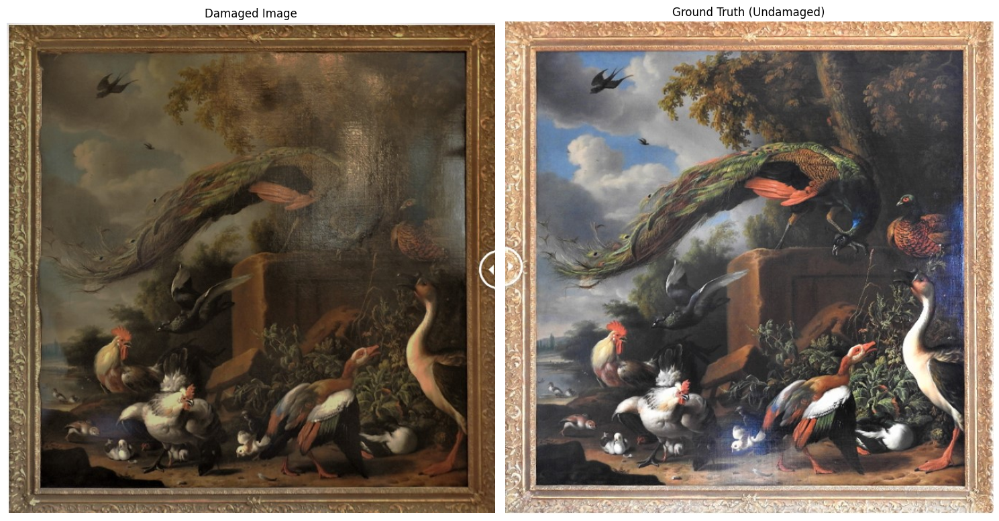

In [5]:
# Load a sample image (let's use the first one from our reliable list)
import random
project_root = os.path.abspath(os.path.join(os.getcwd(), '..'))
data_path = os.path.join(project_root, "data/raw/AI_for_Art_Restoration_2/paired_dataset_art")
damaged_dir = os.path.join(data_path, "damaged")
undamaged_dir = os.path.join(data_path, "undamaged")

# List available images from one directory (since they are now paired)
paired_files = sorted(os.listdir(damaged_dir))
#undamaged_files = sorted(os.listdir(undamaged_dir))
if paired_files:
    sample_file = paired_files[random.randint(0, len(paired_files)-1)]  # You can change the index to explore different images
    print(f"Loading paired image: {sample_file}")
    
    damaged_path = os.path.join(damaged_dir, sample_file)
    undamaged_path = os.path.join(undamaged_dir, sample_file)

    # Read the images
    damaged_img = cv2.imread(damaged_path)
    undamaged_img = cv2.imread(undamaged_path)

    # Check if images loaded correctly
    if damaged_img is not None and undamaged_img is not None:
        # Convert BGR (OpenCV format) to RGB (Matplotlib format) for display
        damaged_rgb = cv2.cvtColor(damaged_img, cv2.COLOR_BGR2RGB)
        undamaged_rgb = cv2.cvtColor(undamaged_img, cv2.COLOR_BGR2RGB)
        
        # Display both images
        display_images(
            [damaged_rgb, undamaged_rgb],
            ["Damaged Image", "Ground Truth (Undamaged)"],
            figsize=(15, 8)
        )
    else:
        print("Error: Could not read one or both of the paired images.")
else:
    print("No paired images found to display.")

## 4. Basic Denoising Techniques

Noise is a common type of degradation in images. Let's explore different denoising methods.

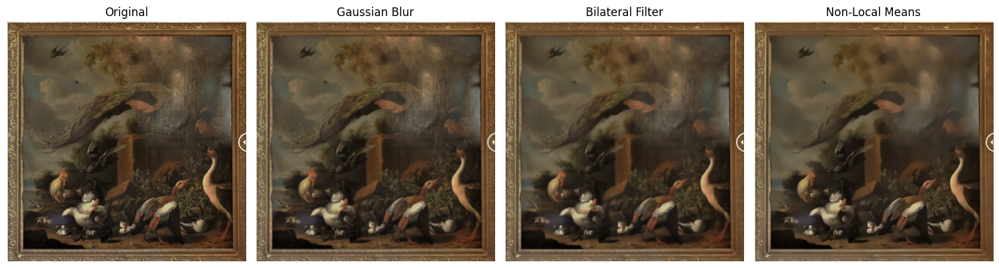

In [8]:
# Apply different denoising methods

# 1. Gaussian Blur - Good for general noise reduction, but blurs edges
from src.basics.basic_restoration import denoise_gaussian, denoise_bilateral, denoise_nlm


denoised_gaussian = denoise_gaussian(damaged_img, kernel_size=5)
denoised_gaussian_rgb = cv2.cvtColor(denoised_gaussian, cv2.COLOR_BGR2RGB)

# 2. Bilateral Filter - Preserves edges while removing noise
denoised_bilateral = denoise_bilateral(damaged_img, d=9, sigma_color=75, sigma_space=75)
denoised_bilateral_rgb = cv2.cvtColor(denoised_bilateral, cv2.COLOR_BGR2RGB)

# 3. Non-Local Means - Excellent for preserving details while removing noise
denoised_nlm = denoise_nlm(damaged_img, h=10)
denoised_nlm_rgb = cv2.cvtColor(denoised_nlm, cv2.COLOR_BGR2RGB)

# Display results
display_images(
    [damaged_rgb, denoised_gaussian_rgb, denoised_bilateral_rgb, denoised_nlm_rgb],
    ["Original", "Gaussian Blur", "Bilateral Filter", "Non-Local Means"]
)

### Analysis of Denoising Results

- **Gaussian Blur**: Simple and fast, but blurs edges and details. Good for removing minor noise.
- **Bilateral Filter**: Preserves edges better than Gaussian blur. It considers both spatial proximity and color similarity.
- **Non-Local Means**: Often produces the best results, especially for textured areas. It's computationally more expensive but preserves details well.

The choice of denoising method depends on the specific type of degradation in the image.

## 5. Enhancing Contrast and Color

Faded colors and poor contrast are common in degraded artwork. Let's explore techniques to enhance them.

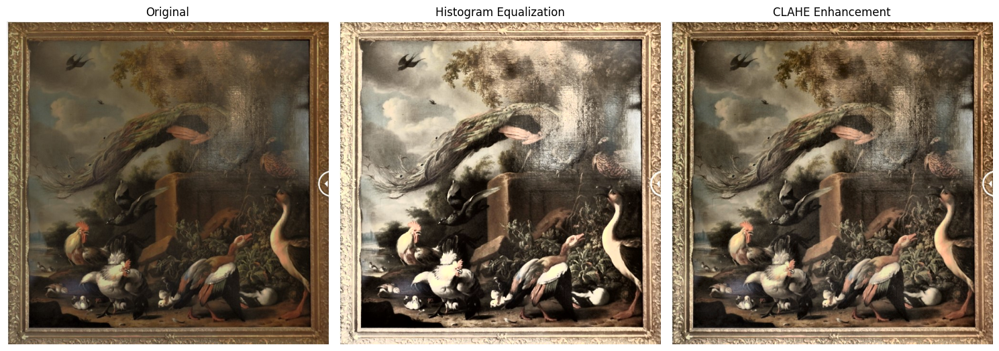

In [10]:
# 1. Simple histogram equalization
from src.basics.basic_restoration import enhance_contrast, enhance_clahe


enhanced_contrast = enhance_contrast(damaged_img)
enhanced_contrast_rgb = cv2.cvtColor(enhanced_contrast, cv2.COLOR_BGR2RGB)

# 2. CLAHE (Contrast Limited Adaptive Histogram Equalization)
enhanced_clahe = enhance_clahe(damaged_img, clip_limit=2.0, grid_size=(8, 8))
enhanced_clahe_rgb = cv2.cvtColor(enhanced_clahe, cv2.COLOR_BGR2RGB)

# Display results
display_images(
    [damaged_rgb, enhanced_contrast_rgb, enhanced_clahe_rgb],
    ["Original", "Histogram Equalization", "CLAHE Enhancement"]
)

### Analysis of Enhancement Results

- **Histogram Equalization**: Spreads out intensity values, which can help in enhancing contrast globally. However, it may amplify noise and produce unnatural results.
- **CLAHE**: Applies histogram equalization in tiles rather than the entire image. This helps in enhancing local contrast while avoiding amplification of noise.

## 6. Removing Scratches and Artifacts

Physical damage like scratches and tears are common in old artwork. Let's explore techniques to remove them.

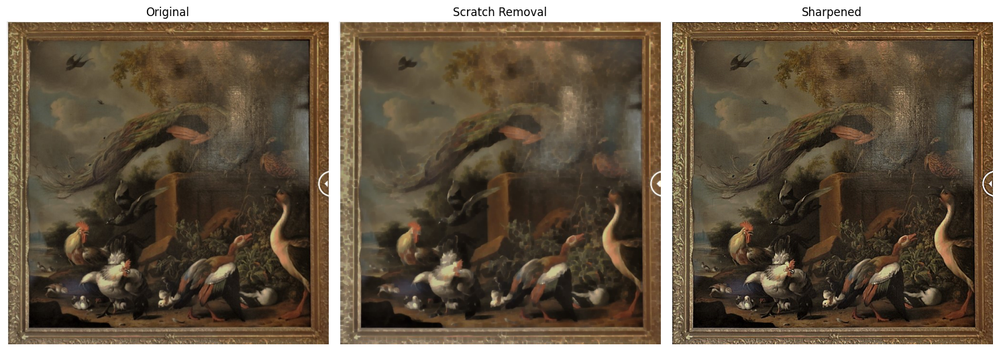

In [11]:
# 1. Morphological operations to remove scratches
from src.basics.basic_restoration import remove_scratches, sharpen_image


no_scratches = remove_scratches(damaged_img, kernel_size=5)
no_scratches_rgb = cv2.cvtColor(no_scratches, cv2.COLOR_BGR2RGB)

# 2. Sharpening to improve details
sharpened = sharpen_image(damaged_img)
sharpened_rgb = cv2.cvtColor(sharpened, cv2.COLOR_BGR2RGB)

# Display results
display_images(
    [damaged_rgb, no_scratches_rgb, sharpened_rgb],
    ["Original", "Scratch Removal", "Sharpened"]
)

### Analysis of Scratch Removal Results

- **Morphological Operations**: Good for removing small scratches and noise by using dilation and erosion operations.
- **Sharpening**: Can help recover lost details, but may also enhance noise if not applied carefully.

## 7. Combining Techniques into a Complete Restoration Pipeline

Let's combine multiple techniques to create a full restoration pipeline.

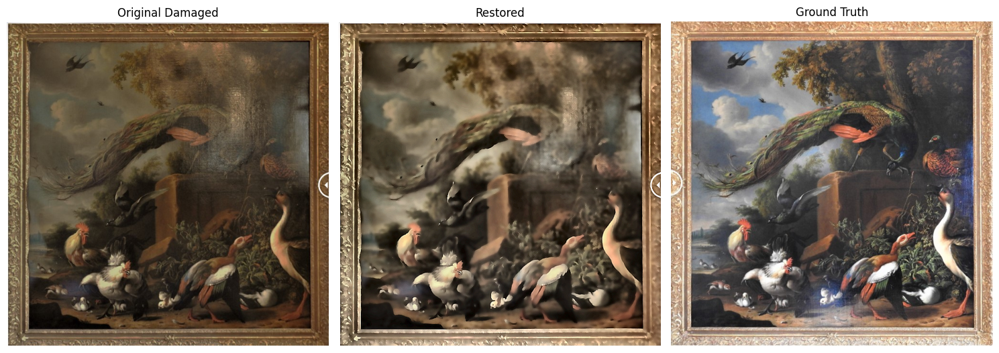

In [12]:
# Apply our complete restoration pipeline
# This will denoise, enhance contrast, and sharpen the image
from src.basics.basic_restoration import restore_image


restored_img = restore_image(damaged_img, techniques=['denoise', 'enhance', 'sharpen'])
restored_rgb = cv2.cvtColor(restored_img, cv2.COLOR_BGR2RGB)

# Compare with original and ground truth (if available)
if undamaged_rgb is not None:
    display_images(
        [damaged_rgb, restored_rgb, undamaged_rgb],
        ["Original Damaged", "Restored", "Ground Truth"]
    )
else:
    display_images(
        [damaged_rgb, restored_rgb],
        ["Original Damaged", "Restored"]
    )

## 8. Advanced: Inpainting for Missing Areas

Inpainting is used to fill in missing or damaged portions of an image. OpenCV provides algorithms to do this.

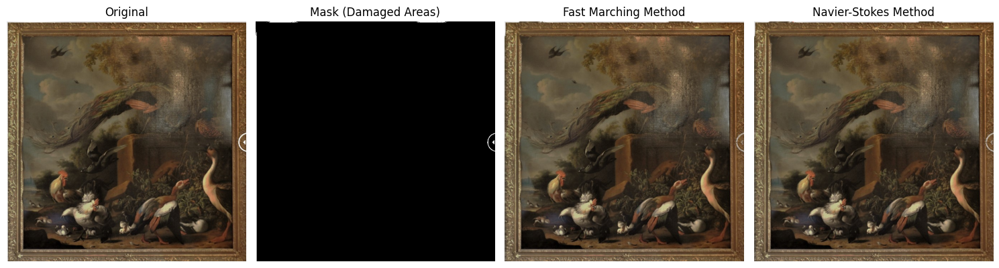

In [13]:
# Function to create a simple mask for demonstration
def create_demo_mask(image, threshold=240):
    """Create a mask for potentially damaged areas (very bright pixels)"""
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image.copy()
    
    _, mask = cv2.threshold(gray, threshold, 255, cv2.THRESH_BINARY)
    return mask

# Create a mask for damaged areas
mask = create_demo_mask(damaged_img)

# Apply inpainting
inpainted_telea = cv2.inpaint(damaged_img, mask.astype(np.uint8), 3, cv2.INPAINT_TELEA)
inpainted_ns = cv2.inpaint(damaged_img, mask.astype(np.uint8), 3, cv2.INPAINT_NS)

# Convert to RGB for display
inpainted_telea_rgb = cv2.cvtColor(inpainted_telea, cv2.COLOR_BGR2RGB)
inpainted_ns_rgb = cv2.cvtColor(inpainted_ns, cv2.COLOR_BGR2RGB)

# Display results
display_images(
    [damaged_rgb, cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB), inpainted_telea_rgb, inpainted_ns_rgb],
    ["Original", "Mask (Damaged Areas)", "Fast Marching Method", "Navier-Stokes Method"]
)

### Inpainting Explanation

- **Fast Marching Method (TELEA)**: Works by propagating image information from the boundary of the damaged region inward.
- **Navier-Stokes Method (NS)**: Based on fluid dynamics, often produces more natural-looking results for larger areas.

Note: For real applications, the mask should be carefully created to identify only the damaged areas. This example uses a simple thresholding approach which may not be ideal for all images.

## 9. Evaluating Restoration Results

If we have ground truth (undamaged) images, we can quantitatively evaluate our restoration results.

## 9.1 Interactive Restoration Pipeline

Let's create an interactive pipeline that allows us to experiment with different restoration techniques and parameters in real-time. Use the sliders and dropdowns below to fine-tune the restoration process and see immediate results.

In [14]:
# Import all necessary libraries and restoration functions
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact, widgets

from src.basics.basic_restoration import (
    denoise_gaussian,
    denoise_bilateral,
    denoise_nlm,
    enhance_contrast,
    enhance_clahe,
    remove_scratches,
    sharpen_image,
    restore_image
)

# Check if images are loaded before creating the interactive widget
try:
    # Test if the variables exist
    _ = damaged_img
    _ = undamaged_img
    images_loaded = True
except NameError:
    images_loaded = False
    print("⚠️  ERROR: Images not loaded yet!")
    print("=" * 80)
    print("Please run the image loading cell first (Cell 9 - Section 3).")
    print("This cell loads 'damaged_img' and 'undamaged_img' which are required")
    print("for the interactive restoration pipeline.")
    print("=" * 80)

# Only define and create the interactive widget if images are loaded
if images_loaded:
    # Define an interactive function to apply selected restoration techniques
    def interactive_restoration(
        denoising_method='Bilateral',
        bilateral_d=9,
        bilateral_sigma_color=75,
        bilateral_sigma_space=75,
        gaussian_kernel=5,
        nlm_h=10,
        
        enhancement_method='CLAHE',
        clahe_clip_limit=2.0,
        clahe_grid_size=8,
        
        apply_sharpening=True,
        sharpen_amount=1.5,
        
        apply_scratch_removal=False,
        morph_kernel_size=5
    ):
        """
        Interactive function that applies selected restoration techniques with customizable parameters.
        Displays: Damaged | Restored | Ground Truth
        """
        try:
            # Make a copy of the damaged image to work with
            restored = damaged_img.copy()
            
            # Step 1: Apply denoising based on selected method
            if denoising_method == 'None':
                pass  # Skip denoising
            elif denoising_method == 'Gaussian':
                restored = denoise_gaussian(restored, kernel_size=gaussian_kernel)
            elif denoising_method == 'Bilateral':
                restored = denoise_bilateral(
                    restored, 
                    d=bilateral_d, 
                    sigma_color=bilateral_sigma_color, 
                    sigma_space=bilateral_sigma_space
                )
            elif denoising_method == 'Non-Local Means':
                restored = denoise_nlm(restored, h=nlm_h)
                
            # Step 2: Apply enhancement based on selected method
            if enhancement_method == 'None':
                pass  # Skip enhancement
            elif enhancement_method == 'Histogram Equalization':
                restored = enhance_contrast(restored)
            elif enhancement_method == 'CLAHE':
                restored = enhance_clahe(
                    restored, 
                    clip_limit=clahe_clip_limit, 
                    grid_size=(clahe_grid_size, clahe_grid_size)
                )
                
            # Step 3: Apply sharpening if selected
            if apply_sharpening:
                restored = sharpen_image(restored, amount=sharpen_amount)
                
            # Step 4: Apply scratch removal if selected
            if apply_scratch_removal:
                restored = remove_scratches(restored, kernel_size=morph_kernel_size)
            
            # Convert images to RGB for display
            damaged_rgb = cv2.cvtColor(damaged_img, cv2.COLOR_BGR2RGB)
            restored_rgb = cv2.cvtColor(restored, cv2.COLOR_BGR2RGB)
            gt_rgb = cv2.cvtColor(undamaged_img, cv2.COLOR_BGR2RGB)
            
            # Create a large figure with three images side by side
            fig, axes = plt.subplots(1, 3, figsize=(20, 7))
            
            # Display Damaged image
            axes[0].imshow(damaged_rgb)
            axes[0].set_title('Damaged Image', fontsize=14, fontweight='bold', color='red')
            axes[0].axis('off')
            
            # Display Restored image
            axes[1].imshow(restored_rgb)
            axes[1].set_title('Restored Image', fontsize=14, fontweight='bold', color='blue')
            axes[1].axis('off')
            
            # Display Ground Truth image
            axes[2].imshow(gt_rgb)
            axes[2].set_title('Ground Truth', fontsize=14, fontweight='bold', color='green')
            axes[2].axis('off')
            
            plt.tight_layout()
            plt.show()
            
            # Calculate and display metrics if ground truth is available
            if undamaged_img is not None:
                # Crop to minimum common size for comparison
                min_h = min(damaged_img.shape[0], undamaged_img.shape[0], restored.shape[0])
                min_w = min(damaged_img.shape[1], undamaged_img.shape[1], restored.shape[1])
                
                damaged_crop = damaged_img[:min_h, :min_w]
                restored_crop = restored[:min_h, :min_w]
                gt_crop = undamaged_img[:min_h, :min_w]
                
                # Calculate PSNR
                def calculate_psnr(img1, img2):
                    mse = np.mean((img1.astype(np.float64) - img2.astype(np.float64)) ** 2)
                    if mse == 0:
                        return float('inf')
                    return 10 * np.log10((255.0 ** 2) / mse)
                
                # Calculate SSIM
                def calculate_ssim(img1, img2):
                    try:
                        from skimage.metrics import structural_similarity as ssim
                        min_side = min(img1.shape[0], img1.shape[1])
                        win_size = min(7, min_side)
                        if win_size % 2 == 0:
                            win_size -= 1
                        return ssim(img1, img2, channel_axis=2, data_range=255, win_size=win_size)
                    except ImportError:
                        return None
                
                psnr_damaged = calculate_psnr(damaged_crop, gt_crop)
                psnr_restored = calculate_psnr(restored_crop, gt_crop)
                psnr_improvement = psnr_restored - psnr_damaged
                
                ssim_damaged = calculate_ssim(damaged_crop, gt_crop)
                ssim_restored = calculate_ssim(restored_crop, gt_crop)
                
                # Display metrics in a nice format
                print("=" * 80)
                print("QUALITY METRICS (Compared to Ground Truth)".center(80))
                print("=" * 80)
                print(f"\n{'Metric':<20} {'Damaged':<20} {'Restored':<20} {'Improvement':<20}")
                print("-" * 80)
                print(f"{'PSNR (dB)':<20} {psnr_damaged:>18.2f} {psnr_restored:>18.2f} {psnr_improvement:>18.2f}")
                
                if ssim_damaged is not None and ssim_restored is not None:
                    ssim_improvement = ssim_restored - ssim_damaged
                    print(f"{'SSIM':<20} {ssim_damaged:>18.4f} {ssim_restored:>18.4f} {ssim_improvement:>18.4f}")
                
                print("-" * 80)
                
                # Interpretation
                if psnr_improvement > 0:
                    print(f"✓ PSNR improved by {psnr_improvement:.2f} dB - Restoration is working!")
                else:
                    print(f"✗ PSNR decreased by {abs(psnr_improvement):.2f} dB - Try different parameters")
                    
                if ssim_damaged is not None and ssim_restored is not None:
                    if ssim_improvement > 0:
                        print(f"✓ SSIM improved by {ssim_improvement:.4f} - Structural similarity increased!")
                    else:
                        print(f"✗ SSIM decreased by {abs(ssim_improvement):.4f} - Try different parameters")
                print("=" * 80)
                
        except Exception as e:
            print(f"Error during restoration: {str(e)}")
            import traceback
            traceback.print_exc()

    # Create interactive widgets with organized layout
    interact(
        interactive_restoration,
        denoising_method=widgets.Dropdown(
            options=['None', 'Gaussian', 'Bilateral', 'Non-Local Means'],
            value='Bilateral',
            description='Denoising:',
            style={'description_width': 'initial'}
        ),
        bilateral_d=widgets.IntSlider(
            min=1, max=15, step=2, value=9,
            description='Bilateral Diameter:',
            disabled=False,
            style={'description_width': 'initial'}
        ),
        bilateral_sigma_color=widgets.IntSlider(
            min=10, max=200, step=5, value=75,
            description='Color Sigma:',
            disabled=False,
            style={'description_width': 'initial'}
        ),
        bilateral_sigma_space=widgets.IntSlider(
            min=10, max=200, step=5, value=75,
            description='Space Sigma:',
            disabled=False,
            style={'description_width': 'initial'}
        ),
        gaussian_kernel=widgets.IntSlider(
            min=1, max=15, step=2, value=5,
            description='Gaussian Kernel:',
            disabled=False,
            style={'description_width': 'initial'}
        ),
        nlm_h=widgets.IntSlider(
            min=1, max=30, step=1, value=10,
            description='NLM Strength:',
            disabled=False,
            style={'description_width': 'initial'}
        ),
        
        enhancement_method=widgets.Dropdown(
            options=['None', 'Histogram Equalization', 'CLAHE'],
            value='CLAHE',
            description='Enhancement:',
            style={'description_width': 'initial'}
        ),
        clahe_clip_limit=widgets.FloatSlider(
            min=0.5, max=8.0, step=0.5, value=2.0,
            description='CLAHE Clip Limit:',
            disabled=False,
            style={'description_width': 'initial'}
        ),
        clahe_grid_size=widgets.IntSlider(
            min=2, max=16, step=2, value=8,
            description='CLAHE Grid Size:',
            disabled=False,
            style={'description_width': 'initial'}
        ),
        
        apply_sharpening=widgets.Checkbox(
            value=True,
            description='Apply Sharpening',
            disabled=False
        ),
        sharpen_amount=widgets.FloatSlider(
            min=0.5, max=3.0, step=0.1, value=1.5,
            description='Sharpen Amount:',
            disabled=False,
            style={'description_width': 'initial'}
        ),
        
        apply_scratch_removal=widgets.Checkbox(
            value=False,
            description='Remove Scratches',
            disabled=False
        ),
        morph_kernel_size=widgets.IntSlider(
            min=1, max=11, step=2, value=5,
            description='Morph Kernel Size:',
            disabled=False,
            style={'description_width': 'initial'}
        )
    );

interactive(children=(Dropdown(description='Denoising:', index=2, options=('None', 'Gaussian', 'Bilateral', 'N…

In [10]:
# Only run this if we have ground truth
if undamaged_img is not None:
    # Crop all images to the minimum common shape
    min_h = min(damaged_img.shape[0], undamaged_img.shape[0], restored_img.shape[0])
    min_w = min(damaged_img.shape[1], undamaged_img.shape[1], restored_img.shape[1])

    damaged_cropped = damaged_img[:min_h, :min_w]
    undamaged_cropped = undamaged_img[:min_h, :min_w]
    restored_cropped = restored_img[:min_h, :min_w]

    # Function to calculate PSNR (Peak Signal-to-Noise Ratio)
    def calculate_psnr(img1, img2):
        mse = np.mean((img1.astype(np.float64) - img2.astype(np.float64)) ** 2)
        if mse == 0:
            return float('inf')
        return 10 * np.log10((255.0 ** 2) / mse)
    
    # Function to calculate SSIM (Structural Similarity Index)
    def calculate_ssim(img1, img2):
        try:
            from skimage.metrics import structural_similarity as ssim
            # Use channel_axis=2 for color images (newer skimage versions)
            # Set win_size to the minimum odd value <= min(img1.shape[0], img1.shape[1], 7)
            min_side = min(img1.shape[0], img1.shape[1])
            win_size = min(7, min_side)
            if win_size % 2 == 0:
                win_size -= 1
            return ssim(img1, img2, channel_axis=2, data_range=255, win_size=win_size)
        except ImportError:
            print("scikit-image is required for SSIM calculation")
            return None
    
    # Calculate metrics
    psnr_damaged = calculate_psnr(damaged_cropped, undamaged_cropped)
    psnr_restored = calculate_psnr(restored_cropped, undamaged_cropped)
    
    ssim_damaged = calculate_ssim(damaged_cropped, undamaged_cropped)
    ssim_restored = calculate_ssim(restored_cropped, undamaged_cropped)
    
    print(f"Metrics comparing with ground truth:")
    print(f"PSNR - Original damaged: {psnr_damaged:.2f} dB, Restored: {psnr_restored:.2f} dB")
    if ssim_damaged is not None and ssim_restored is not None:
        print(f"SSIM - Original damaged: {ssim_damaged:.4f}, Restored: {ssim_restored:.4f}")
        
    print(f"\nImprovement:")
    print(f"PSNR improvement: {psnr_restored - psnr_damaged:.2f} dB")
    if ssim_damaged is not None and ssim_restored is not None:
        print(f"SSIM improvement: {ssim_restored - ssim_damaged:.4f}")
else:
    print("No ground truth image available for quantitative evaluation")

Metrics comparing with ground truth:
PSNR - Original damaged: 12.20 dB, Restored: 11.58 dB
SSIM - Original damaged: 0.5200, Restored: 0.4795

Improvement:
PSNR improvement: -0.63 dB
SSIM improvement: -0.0406



<VSCode.Cell language="markdown">
## 9.1 Interactive Restoration Pipeline

Now, let's combine everything into a single, interactive pipeline. Use the sliders and dropdowns below to see how different parameters and techniques affect the final restored image in real-time. This is the best way to build an intuition for what works!
</VSCode.Cell>
<VSCode.Cell language="python">
def interactive_restoration(
    image, 
    ground_truth,
    denoising='Bilateral', 
    bilateral_d=9, 
    bilateral_sigma=75, 
    nlm_h=10,
    enhancement='CLAHE',
    clahe_limit=2.0,
    sharpening=True,
    sharpen_amount=1.5
):
    """
    An interactive function to apply a sequence of restoration techniques.
    """
    restored = image.copy()

    # 1. Denoising Step
    if denoising == 'Bilateral':
        restored = denoise_bilateral(restored, d=bilateral_d, sigma_color=bilateral_sigma, sigma_space=bilateral_sigma)
    elif denoising == 'NLM':
        restored = denoise_nlm(restored, h=nlm_h)

    # 2. Enhancement Step
    if enhancement == 'CLAHE':
        restored = enhance_clahe(restored, clip_limit=clahe_limit)
    elif enhancement == 'Histogram Equalization':
        restored = enhance_contrast(restored)

    # 3. Sharpening Step
    if sharpening:
        restored = sharpen_image(restored, amount=sharpen_amount)

    # Convert images to RGB for display
    original_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    restored_rgb = cv2.cvtColor(restored, cv2.COLOR_BGR2RGB)
    
    images_to_display = [original_rgb, restored_rgb]
    titles = ["Original Damaged", "Interactive Restoration"]

    if ground_truth is not None:
        gt_rgb = cv2.cvtColor(ground_truth, cv2.COLOR_BGR2RGB)
        images_to_display.append(gt_rgb)
        titles.append("Ground Truth")

    display_images(images_to_display, titles)

# Set up the interactive widgets
interact(
    interactive_restoration,
    image=fixed(damaged_img),
    ground_truth=fixed(undamaged_img),
    denoising=widgets.Dropdown(options=['None', 'Bilateral', 'NLM'], value='Bilateral', description='Denoising:'),
    bilateral_d=widgets.IntSlider(min=1, max=15, step=2, value=9, description='Bilateral Diameter:'),
    bilateral_sigma=widgets.IntSlider(min=1, max=200, step=5, value=75, description='Bilateral Sigma:'),
    nlm_h=widgets.IntSlider(min=1, max=30, step=1, value=10, description='NLM Strength:'),
    enhancement=widgets.Dropdown(options=['None', 'CLAHE', 'Histogram Equalization'], value='CLAHE', description='Enhancement:'),
    clahe_limit=widgets.FloatSlider(min=1.0, max=10.0, step=0.5, value=2.0, description='CLAHE Limit:'),
    sharpening=widgets.Checkbox(value=True, description='Apply Sharpening'),
    sharpen_amount=widgets.FloatSlider(min=1.0, max=5.0, step=0.1, value=1.5, description='Sharpen Amount:')
);
</VSCode.Cell>


## 10. Trying a Different Image

Let's try our restoration pipeline on a different image from the dataset.

Found matching undamaged image for 9.png


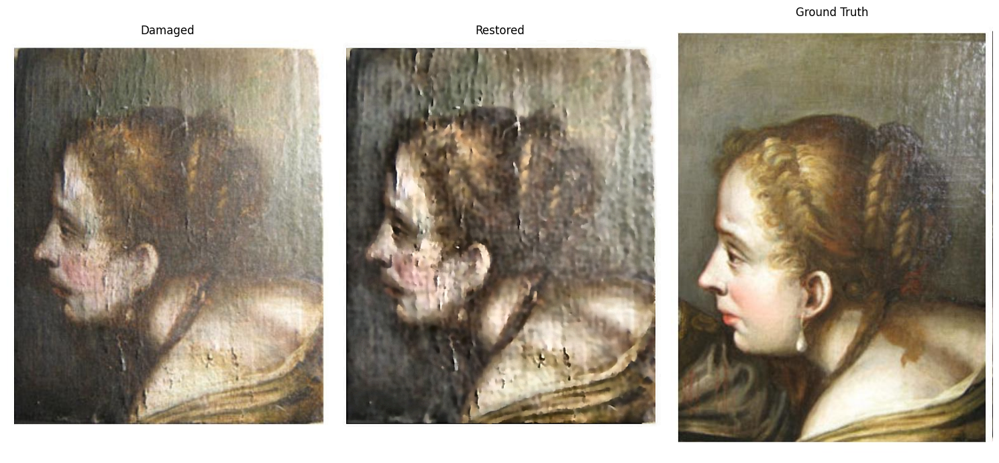

In [21]:
# Try another image (select a different index)
if len(damaged_files) > 1:
    # Choose a different image
    sample_file2 = damaged_files[random.randint(0, len(damaged_files)- 1)]  # Change this index to try different images
    damaged_path2 = os.path.join(damaged_dir, sample_file2)
    
    # Read the image
    damaged_img2 = cv2.imread(damaged_path2)
    
    if damaged_img2 is not None:
        # Convert BGR to RGB for display
        damaged_rgb2 = cv2.cvtColor(damaged_img2, cv2.COLOR_BGR2RGB)
        
        # Apply our restoration pipeline
        restored_img2 = restore_image(damaged_img2)
        restored_rgb2 = cv2.cvtColor(restored_img2, cv2.COLOR_BGR2RGB)
        
        # Try to find the corresponding undamaged image if available
        undamaged_img2 = None
        undamaged_rgb2 = None
        undamaged_path2 = os.path.join(undamaged_dir, sample_file2)
        
        if os.path.exists(undamaged_path2):
            undamaged_img2 = cv2.imread(undamaged_path2)
            undamaged_rgb2 = cv2.cvtColor(undamaged_img2, cv2.COLOR_BGR2RGB)
            print(f"Found matching undamaged image for {sample_file2}")
            
            # Display results
            display_images(
                [damaged_rgb2, restored_rgb2, undamaged_rgb2],
                ["Damaged", "Restored", "Ground Truth"]
            )
        else:
            print(f"No matching undamaged image found for {sample_file2}")
            display_images(
                [damaged_rgb2, restored_rgb2],
                ["Damaged", "Restored"]
            )
    else:
        print(f"Failed to load image {sample_file2}")
else:
    print("Not enough images in the dataset to try another one")

## 11. Conclusion

In this tutorial, we've explored several image restoration techniques:

1. **Denoising**: Gaussian blur, bilateral filter, and non-local means for noise removal
2. **Contrast Enhancement**: Histogram equalization and CLAHE for improving faded images
3. **Scratch Removal**: Using morphological operations to reduce physical damage
4. **Inpainting**: Filling in missing or heavily damaged regions
5. **Full Restoration Pipeline**: Combining multiple techniques for better results

Each technique has its strengths and is useful for different types of degradation. In practice, the choice of technique depends on the specific damage in the artwork.

### Next Steps

1. Experiment with different parameter values for each technique
2. Try creating custom restoration pipelines for specific types of damage
3. Explore advanced techniques like deep learning-based restoration (e.g., U-Net)
4. Apply these techniques to other damaged artwork in the dataset